# C. Perform MintPy Time Series Analysis

*Author: Alex Lewandowski; Alaska Satellite Facility*

This notebook assumes that you have loaded a time series into MintPy and have prepared a custom configuration file.


**MintPy Workflow**
<p align="left">
  <img width="600" src="https://opensarlab-docs.asf.alaska.edu/opensarlab-notebook-assets/notebook_images/MintPyWorkflow.jpg">
</p>     
<p style="text-align: center;">
    (Figure from Yunjun et al., 2019)
</p>

- Blue Ovals: correcting unwrapping errors and inverting for the raw phase time-series
- Green Ovals: correcting for noise from different sources to obtain the displacement time-series
- Dashed Ovals: Optional Steps

---
## 0. Import Required Software


In [1]:
from pathlib import Path
import shutil
import sys

import h5py
from ipyfilechooser import FileChooser
from mintpy.cli import view, tsview, plot_network, plot_transection
import mintpy.utils
from mintpy.utils import plot, readfile
import numpy as np
import opensarlab_lib as osl

current = Path("..").resolve()
sys.path.append(str(current))
import util.util as util

---
## 1. Select your project's custom config file

- This is located in your project's `MintPy` directory
- It is a text file named after your project
  - `path/to/MinPy/my_project.txt`

In [2]:
file_chooser_path = util.get_recent_mintpy_config_path()
if file_chooser_path:
    fc = FileChooser(path=file_chooser_path.parent, filename=file_chooser_path.name, select_default=True)
else:
    file_chooser_path = Path.home()
    fc = FileChooser(file_chooser_path, select_default=False)
    
print("Select your custom MintPy config file (MintPy/my_project_name.txt):")
display(fc)

Select your custom MintPy config file (MintPy/my_project_name.txt):


FileChooser(path='/home/jovyan/la2_test/MintPy', filename='smallbaselineApp.cfg', title='', show_hidden=False,…

In [3]:
if Path(fc.selected) != file_chooser_path:
    util.write_recent_mintpy_config_path(Path(fc.selected))

config_path = Path(fc.selected)
mint_path = config_path.parent
inputs_path = mint_path / 'inputs'
ifgram_path = inputs_path / 'ifgramStack.h5'
plot_path = mint_path / 'plots'
velocity_path = mint_path/'velocity.h5'

---
## 2. Modify the Network

**Run the `modify_network` step**

- Identifies and excludes interferograms (i.e. affected by remaining coherence phase-unwrapping errors) before the network inversion
- Updates metadata with changes to your custom config

In [4]:
!smallbaselineApp.py $config_path --work-dir {mint_path} --dostep modify_network

MintPy version 1.5.3, date 2023-11-23
--RUN-at-2024-04-19 19:10:42.119984--
Current directory: /home/jovyan/test_MintPy_OpenSARLab/LA2
Run routine processing with smallbaselineApp.py on steps: ['modify_network']
Remaining steps: ['reference_point', 'quick_overview', 'correct_unwrap_error', 'invert_network', 'correct_LOD', 'correct_SET', 'correct_troposphere', 'deramp', 'correct_topography', 'residual_RMS', 'reference_date', 'velocity', 'geocode', 'google_earth', 'hdfeos5']
--------------------------------------------------
Go to work directory: /home/jovyan/la2_test/MintPy
obsolete default template detected, update to the latest version.
    mintpy.compute.cluster: auto --> local
    mintpy.compute.numWorker: auto --> 8
    mintpy.load.processor: auto --> hyp3
    mintpy.load.unwFile: auto --> /home/jovyan/la2_test/*/*_unw_phase*.tif
    mintpy.load.corFile: auto --> /home/jovyan/la2_test/*/*_corr*.tif
    mintpy.load.demFile: auto --> /home/jovyan/la2_test/*/*_dem*.tif
    mintpy.load

---
## 3. Plot the interferogram network

Running **plot_network.py** gives an overview of the network and the average coherence of the stack. The program creates multiple files as follows:
- `ifgramStack_coherence_spatialAvg.txt`: Contains interferogram dates, average coherence temporal and spatial baseline separation.
- `Network.pdf`: Displays the network of interferograms on time-baseline coordinates, colorcoded by avergae coherence of the interferograms. 
- `CoherenceMatrix.pdf` shows the avergae coherence pairs between all available pairs in the stack.

read temporal/spatial baseline info from file: /home/jovyan/la2_test/MintPy/inputs/ifgramStack.h5
open ifgramStack file: ifgramStack.h5
['coherenceSpatialAvg.txt'] exists and is newer than ['waterMask.h5'] --> skip.
coherenceSpatialAvg.txt already exists, read it directly
number of acquisitions: 64
number of interferograms: 121
shift all perp baseline by -110.72483825683594 to zero mean for plotting
--------------------------------------------------
number of interferograms marked as drop: 0
number of interferograms marked as keep: 121
number of acquisitions marked as drop: 0
max perpendicular baseline: 367.85 m
max temporal      baseline: 24.0 days
showing coherence
data range: [0.5657, 0.9478]
display range: (0.2, 1.0)
showing ...


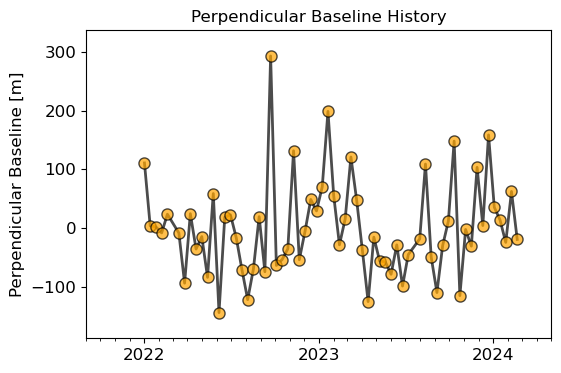

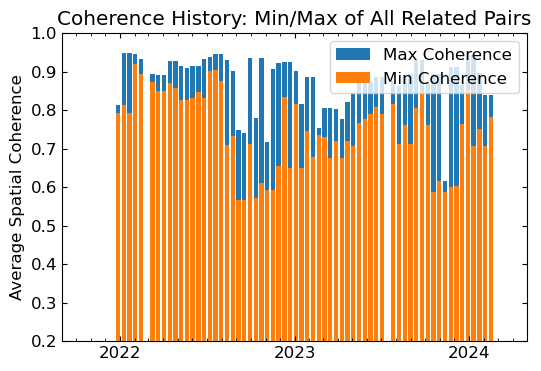

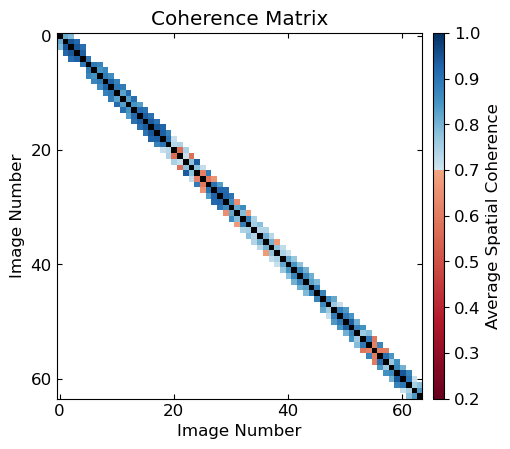

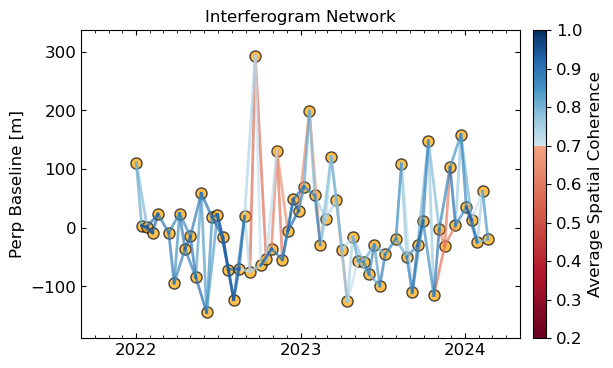

In [5]:
%matplotlib inline
with osl.work_dir(mint_path):
    scp_args = f'{inputs_path}/ifgramStack.h5 --cmap-vlist 0.2 0.7 1.0'
    plot_network.main(scp_args.split())
    plots = ['pbaseHistory.pdf', 'coherenceHistory.pdf', 'coherenceMatrix.pdf', 'network.pdf']
    for p in plots:
        if (mint_path/p).exists():
            (mint_path/p).rename(f'{plot_path}/{p}')

---
## 4. Set the Reference Point

**Run the `reference_point` step**

The interferometric phase is a relative observation by nature. The phases of each unwrapped interferogram are relative with respect to an arbitrary pixel. Therfore, we need to reference all interferograms to a common reference pixel.

The `reference_point` step selects a common reference pixel for the stack of interferograms. The default approach of MintPy is to choose a pixel with the highest spatial coherence in the stack. Other options include specifying the longitude and latitude of the desired reference pixel or the line and column number of the refence pixel. 

In [7]:
!smallbaselineApp.py $config_path --work-dir {mint_path} --dostep reference_point

MintPy version 1.5.3, date 2023-11-23
--RUN-at-2024-04-19 19:12:05.208501--
Current directory: /home/jovyan/test_MintPy_OpenSARLab/LA2
Run routine processing with smallbaselineApp.py on steps: ['reference_point']
Remaining steps: ['quick_overview', 'correct_unwrap_error', 'invert_network', 'correct_LOD', 'correct_SET', 'correct_troposphere', 'deramp', 'correct_topography', 'residual_RMS', 'reference_date', 'velocity', 'geocode', 'google_earth', 'hdfeos5']
--------------------------------------------------
Go to work directory: /home/jovyan/la2_test/MintPy
obsolete default template detected, update to the latest version.
    mintpy.compute.cluster: auto --> local
    mintpy.compute.numWorker: auto --> 8
    mintpy.load.processor: auto --> hyp3
    mintpy.load.unwFile: auto --> /home/jovyan/la2_test/*/*_unw_phase*.tif
    mintpy.load.corFile: auto --> /home/jovyan/la2_test/*/*_corr*.tif
    mintpy.load.demFile: auto --> /home/jovyan/la2_test/*/*_dem*.tif
    mintpy.load.incAngleFile: aut

**Confirm presence of expected output files from `reference_point` step**

In [8]:
spatial_coh_pth = mint_path / 'avgSpatialCoh.h5'
conn_comp_mask_path = mint_path / 'maskConnComp.h5'

if not spatial_coh_pth.exists():
    raise Exception(f'Possible error running smallbaselineApp reference_point step. Expected output not found: {spatial_coh_pth}')
if not conn_comp_mask_path.exists():
    raise Warning(f'Possible error running smallbaselineApp reference_point step. Ignore if you are using HyP3 INSAR_GAMMA data, which does not include connected components. Expected output not found: {conn_comp_mask_path}')

**Running the "reference_step" adds additional attributes "REF_X, REF_Y" and "REF_LON, REF_LAT" to the `ifgramStack.h5` file. To see the attributes of the file run `info.py`**

In [9]:
!info.py $inputs_path/ifgramStack.h5 | egrep 'REF_'

  REF_LAT                      3750160.0
  REF_LON                      452960.0
  REF_X                        1514
  REF_Y                        455


---
## 5. Run a Quick Overview

**Run the `quick_overview` step**

- Assess possible groud deformation using the velocity from traditional interferogram stacking 
    - *reference: Zebker et al. (1997, JGR)*
- Assess distribution of phase unwrapping error from the number of interferogram triplets with non-zero integer ambiguity of closure phase 
    - *reference: T_int in Yunjun et al. (2019, CAGEO). Related to section 3.2, equation (8-9) and Fig. 3d-e.*

In [10]:
!smallbaselineApp.py $config_path --work-dir {mint_path} --dostep quick_overview

MintPy version 1.5.3, date 2023-11-23
--RUN-at-2024-04-19 19:12:25.363783--
Current directory: /home/jovyan/test_MintPy_OpenSARLab/LA2
Run routine processing with smallbaselineApp.py on steps: ['quick_overview']
Remaining steps: ['correct_unwrap_error', 'invert_network', 'correct_LOD', 'correct_SET', 'correct_troposphere', 'deramp', 'correct_topography', 'residual_RMS', 'reference_date', 'velocity', 'geocode', 'google_earth', 'hdfeos5']
--------------------------------------------------
Go to work directory: /home/jovyan/la2_test/MintPy
read default template file: /home/jovyan/la2_test/MintPy/smallbaselineApp.cfg


******************** step - quick_overview ********************
Input data seems to be geocoded. Lookup file not needed.

temporal_average.py /home/jovyan/la2_test/MintPy/inputs/ifgramStack.h5 --dataset unwrapPhase -o /home/jovyan/la2_test/MintPy/avgPhaseVelocity.h5 --update
--------------------------------------------------
update mode: ON
1) output file /home/jovyan/la2_te

**Confirm presence of expected output files from `quick_overview` step**

In [11]:
avg_phase_vel_path = mint_path / 'avgPhaseVelocity.h5'

if not avg_phase_vel_path.exists():
    raise Exception(f'Possible error running smallbaselineApp quick_overview step. Expected output not found: {avg_phase_vel_path}')

---
## 6. Perform Phase Unwrapping Error Correction (Optional)

- This can be performed on `HYP3_ISCE_BURST` data but not on `HYP3_GAMMA` data
  - Gamma processing software does not produce the connected components data required for this step
- To perform unwrapping error correction, you must configure your time series's `mintpy.unwrapError.method` setting to one of the following options:
  -  `bridging`
      - suitable for regions separated by narrow decorrelated features, e.g. rivers, narrow water bodies 
  -  `phase-closure`
      - suitable for highly redundant network 
  -  `bridging+phase_closure`
      -  recommended when there is a small percentage of errors left after bridging
 
**Visually examine the unwrapped interferograms for potential phase unwrapping errors**

ifg_vmin: -38.726287841796875, ifg_vmax: 38.726287841796875
view.py /home/jovyan/la2_test/MintPy/inputs/ifgramStack.h5 unwrapPhase-* -v -38.726287841796875 38.726287841796875 --zero-mask --noaxis --noverbose --figsize 12 50 --no-tight-layout


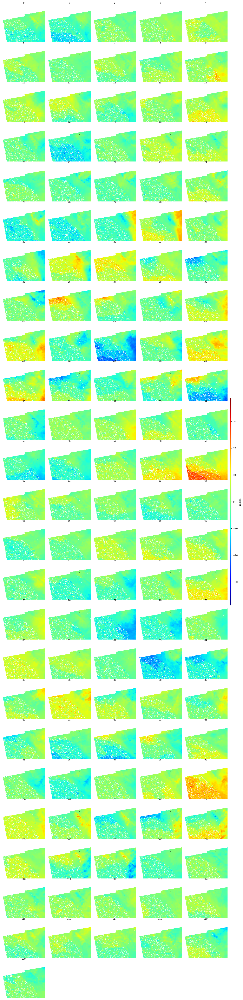

In [12]:
%matplotlib inline

ifg_vmin, ifg_vmax = util.get_mintpy_vmin_vmax(ifgram_path, bottom_percentile=0.05)
ifg_vmin /= 100
ifg_vmax /= 100
print(f"ifg_vmin: {ifg_vmin}, ifg_vmax: {ifg_vmax}")

args = f'{ifgram_path} unwrapPhase-* -v {ifg_vmin} {ifg_vmax} --zero-mask --noaxis --noverbose --figsize 12 50 --no-tight-layout'
view.main(args.split())

**Examine the number of interferogram triples with non-zero phase closure**

For an interferogram triplet ($\Delta\phi^{ij}$, $\Delta\phi^{jk}$ and $\Delta\phi^{ik}$), unwrapping errors will introduce a non-zero integer component $C_{int}^{ijk}$ in the closure phase $C^{ijk}$. Therefore, the number of interferogram triplets with non-zero integer ambiguity $T_{int}$ can be used to detect unwrapping errors (Yunjun et al., 2019):

$$ \large C^{ijk}=\Delta\phi^{ij}+\Delta\phi^{jk}-\Delta\phi^{ik}$$

$$ \large C_{int}^{ijk}=\frac{C^{ijk}-wrap(C^{ijk})}{2\pi}$$

$$ \large T_{int}=\sum_{i=1}^T(C_{int}^{ijk}!=0)$$

where $warp$ is an operator to wrap the input number into $[-\pi, \pi)$; $T$ is the number of interferogram triplets.

**Plot the histogram for the number of triplets with non-zero integer ambiguity.**

Take home messages from $T_{int}$ map and histogram:

1. Areas with $T_{int}$ > 0 have unwrapping errors.
2. Areas sharing the common positive $T_{int}$ value could be corrected.
3. Areas with wide-distributed $T_{int}$ value indicates random unwrapping errors, which are difficult to correct.

(https://github.com/parosen/Geo-SInC/blob/main/EarthScope2023/5.2_Intro_to_MintPy/smallbaselineApp_aria.ipynb)

MintPy version 1.5.3, date 2023-11-23
--RUN-at-2024-04-19 19:13:56.042200--
Current directory: /home/jovyan/la2_test/MintPy
Run routine processing with smallbaselineApp.py on steps: ['quick_overview']
Remaining steps: ['correct_unwrap_error', 'invert_network', 'correct_LOD', 'correct_SET', 'correct_troposphere', 'deramp', 'correct_topography', 'residual_RMS', 'reference_date', 'velocity', 'geocode', 'google_earth', 'hdfeos5']
--------------------------------------------------
Go to work directory: /home/jovyan/la2_test/MintPy
read default template file: /home/jovyan/la2_test/MintPy/smallbaselineApp.cfg


******************** step - quick_overview ********************
Input data seems to be geocoded. Lookup file not needed.

temporal_average.py /home/jovyan/la2_test/MintPy/inputs/ifgramStack.h5 --dataset unwrapPhase -o /home/jovyan/la2_test/MintPy/avgPhaseVelocity.h5 --update
--------------------------------------------------
update mode: ON
1) output file /home/jovyan/la2_test/MintPy/a

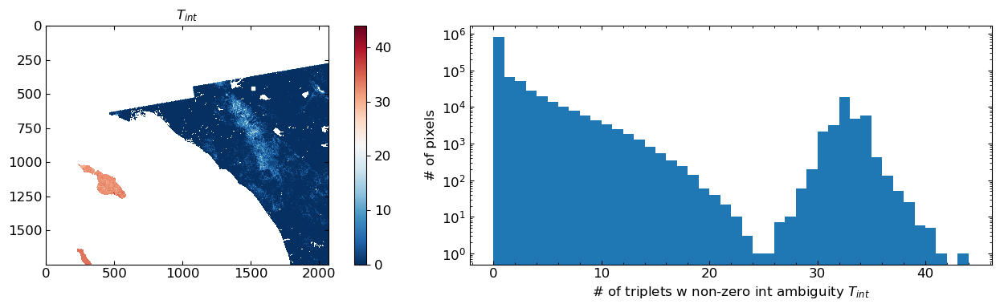

In [13]:
%matplotlib inline

with osl.work_dir(mint_path):
    !smallbaselineApp.py {config_path} --dostep quick_overview
    plot.plot_num_triplet_with_nonzero_integer_ambiguity(mint_path/'numTriNonzeroIntAmbiguity.h5', disp_fig=True, fig_size=[14, 4])

**Confirm that an unwrapping error method was not defined in the config if working with `HYP3_GAMMA` data**

- `HYP3_GAMMA` products do not include required connected components data
- Setting a `mintpy.unwrapError.method` when working with `HYP3_GAMMA` data will cause the inversion step to fail, as expected `unwrapPhase_bridging` and/or `unwrapPhase_phaseClosure` datasets will be missing
- Check and (if needed) correct this situation in the cell below

In [14]:
config_dict = readfile.read_template(config_path)
hyp3_isce_burst = 'mintpy.load.connCompFile' in config_dict.keys()
unwrap_error_correct = 'mintpy.unwrapError.method' in config_dict.keys() and config_dict['mintpy.unwrapError.method'] not in ['no', 'auto']

if unwrap_error_correct and not hyp3_isce_burst:
    config_dict['mintpy.unwrapError.method'] = 'no'
    config_str = ""
    for k, v in config_dict.items():
        config_str += f'{k} = {v}\n'
    config_path.write_text(config_str)  
    unwrap_error_correct = False

**Perform the `correct_unwrap_error` step**

In [15]:
if unwrap_error_correct:
    with osl.work_dir(mint_path):
        !smallbaselineApp.py {config_path} --dostep correct_unwrap_error

**Confirm presence of expected output dataset/s from `correct_unwrap_error` step**

In [16]:
if unwrap_error_correct:
    unw_err_ds = []
    if 'bridging' in config_dict['mintpy.unwrapError.method']:
        unw_err_ds.append('unwrapPhase_bridging')
    if 'phase_closure' in config_dict['mintpy.unwrapError.method']:
        unw_err_ds.append('unwrapPhase_phaseClosure')
    with h5py.File(ifgram_path, 'r') as f:
        for ds in unw_err_ds:
            if ds not in f.keys():
                raise Exception(f'Possible error running smallbaselineApp correct_unwrap_error step. Expected output dataset ({ds}) not found in  {ifgram_path}')

**Plot the interferograms after unwrapping error correction**

In [17]:
%matplotlib inline
if unwrap_error_correct:
    print("This may take some time and appear to show a blank plot while all the subplots load.\n")
    unwrapp_args = f'{ifgram_path} unwrap* --zero-mask --figsize 12 50 --noverbose --no-tight-layout'
    view.main(unwrapp_args.split())

**Plot the connected components**

In [18]:
%matplotlib inline
if unwrap_error_correct:
    print("This may take some time and appear to show a blank plot while all the subplots load.\n")
    unwrapp_args = f'{ifgram_path} conn* --zero-mask --figsize 12 50 --noverbose --no-tight-layout'
    view.main(unwrapp_args.split())

---
## 7. Inverting the Small Baseline network

**Run the `invert_network` step**

- Invert the network of differential unwrapped interferograms to estimate the time-series of unwrapped phase with respect to a reference acquisition date
- By default mintpy selects the first acquisition
- The estimated time-series is converted to distance change from radar to target and is provided in meters.

In [19]:
!smallbaselineApp.py $config_path --work-dir {mint_path} --dostep invert_network

MintPy version 1.5.3, date 2023-11-23
--RUN-at-2024-04-19 19:14:38.353686--
Current directory: /home/jovyan/test_MintPy_OpenSARLab/LA2
Run routine processing with smallbaselineApp.py on steps: ['invert_network']
Remaining steps: ['correct_LOD', 'correct_SET', 'correct_troposphere', 'deramp', 'correct_topography', 'residual_RMS', 'reference_date', 'velocity', 'geocode', 'google_earth', 'hdfeos5']
--------------------------------------------------
Go to work directory: /home/jovyan/la2_test/MintPy
read default template file: /home/jovyan/la2_test/MintPy/smallbaselineApp.cfg


******************** step - invert_network ********************
Input data seems to be geocoded. Lookup file not needed.

ifgram_inversion.py /home/jovyan/la2_test/MintPy/inputs/ifgramStack.h5 -t /home/jovyan/la2_test/MintPy/smallbaselineApp.cfg --update
read input option from template file: /home/jovyan/la2_test/MintPy/smallbaselineApp.cfg
use dataset "unwrapPhase" by default
---------------------------------------

**Confirm presence of expected output files from `invert_network` step**

In [20]:
ts_path = mint_path / 'timeseries.h5'
temp_coh_path = mint_path / 'temporalCoherence.h5'
num_inv_ifgram_path = mint_path / 'numInvIfgram.h5'

for pth in [ts_path, temp_coh_path, num_inv_ifgram_path]:
    if not pth.exists():
        raise Exception(f'Possible error running smallbaselineApp invert_network step. Expected output not found: {pth}')

**Plot the inverted time series**

run view.py in MintPy version 1.5.3, date 2023-11-23
input file is timeseries file: /home/jovyan/la2_test/MintPy/timeseries.h5 in float32 format
file size in y/x: (1750, 2069)
num of datasets in file timeseries.h5: 64
datasets to exclude (0):
[]
datasets to display (64):
['timeseries-20220101', 'timeseries-20220113', 'timeseries-20220125', 'timeseries-20220206', 'timeseries-20220218', 'timeseries-20220314', 'timeseries-20220326', 'timeseries-20220407', 'timeseries-20220419', 'timeseries-20220501', 'timeseries-20220513', 'timeseries-20220525', 'timeseries-20220606', 'timeseries-20220618', 'timeseries-20220630', 'timeseries-20220712', 'timeseries-20220724', 'timeseries-20220805', 'timeseries-20220817', 'timeseries-20220829', 'timeseries-20220910', 'timeseries-20220922', 'timeseries-20221004', 'timeseries-20221016', 'timeseries-20221028', 'timeseries-20221109', 'timeseries-20221121', 'timeseries-20221203', 'timeseries-20221215', 'timeseries-20221227', 'timeseries-20230108', 'timeseries-20

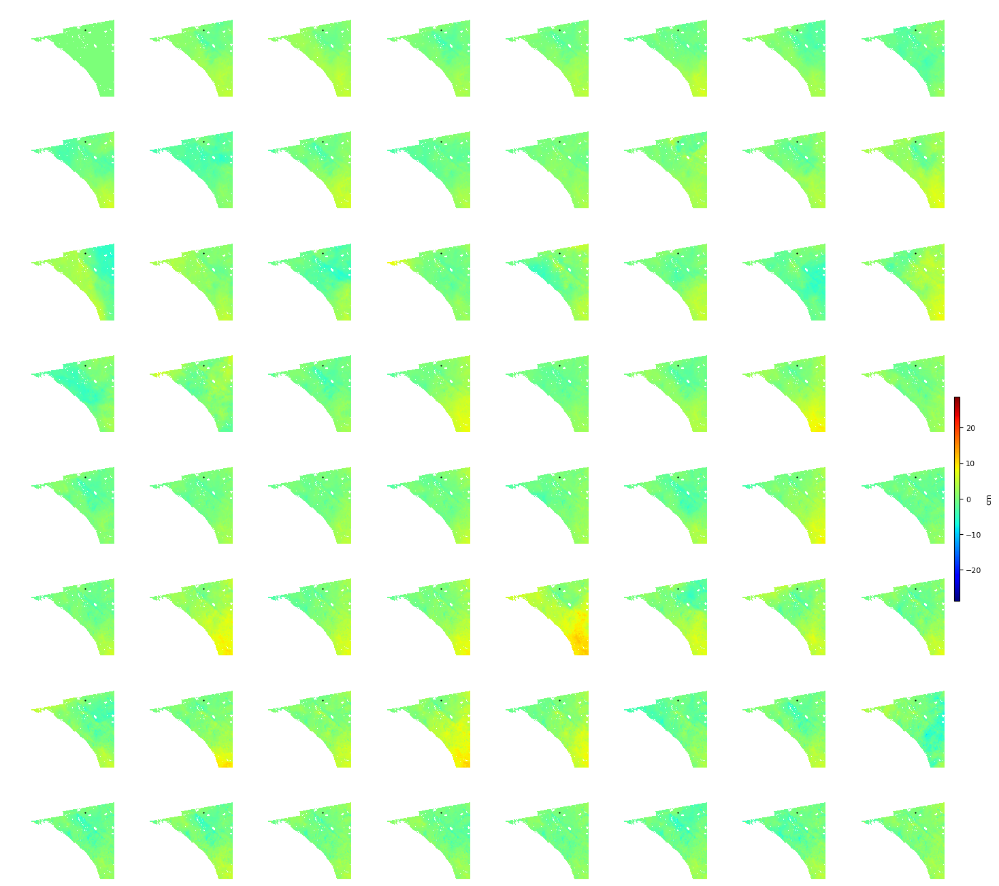

In [21]:
%matplotlib inline
inv_vmin, inv_vmax = util.get_mintpy_vmin_vmax(ts_path, mask_path=mint_path/'maskTempCoh.h5', bottom_percentile=0.0)

# uncomment the following 2 lines to manually set the vmin and vmax values
# inv_vmin = -2.0
# inv_vmax = 2.0

scp_args = f'{ts_path} --notitle --notick --noaxis -v {inv_vmin} {inv_vmax} --dpi 600 --figsize 15 15'
view.main(scp_args.split())

---
## 8. Correct for Tropospheric Propagation Delays (Optional)


<div class="alert alert-warning">
<font face="Calibri" size="5"><b><font color='rgba(200,0,0,0.2)'> <u>CDS is migrating data and current service is impacted</u></font></b></font>
<br/>
<font face="Calibri" size="4">   February 14, 2024
</font>
<br/>
<font face="Calibri" size="3"><a href="https://forum.ecmwf.int/t/a-new-cds-soon-to-be-launched-expect-some-disruptions/1607">https://forum.ecmwf.int/t/a-new-cds-soon-to-be-launched-expect-some-disruptions/1607</a>
    <br/><br/>
<i><b>Expect:</b>
    <ul>
<li>longer queues</li>
<li>requests being cancelled</li>
<li>temporary closure of queues</li>
<li>requests failing with unusual error messages</li>
<li>catalogue temporarily offline</li>
</font>
</div>

**Run the `correct_troposphere` step**

***This will be skipped if `mintpy.troposphericDelay.method` is set to "no" in your custom config***

- Requires configuring a `.cdsapirc` file for CDS access
  - Run the `CDS_Access.ipynb` (Set Up Climate Data Store Access) Notebook
- Uses ECMWF [ERA5 climate reanalysis pressure data](https://cds.climate.copernicus.eu/cdsapp#!/search?type=dataset&keywords=((%20%22Product%20type:%20Reanalysis%22%20)%20AND%20(%20%22Provider:%20Copernicus%20C3S%22%20))&text=pressure)

In [22]:
template = mintpy.utils.readfile.read_template(config_path)

tropo = ('mintpy.troposphericDelay.method' in template.keys() and template['mintpy.troposphericDelay.method'] != 'no') or \
'mintpy.troposphericDelay.method' not in template.keys()

era5_path = mint_path / 'ERA5'
timeseries_era5_path = mint_path / 'timeseries_ERA5.h5'
inputs_era5_path = mint_path / 'inputs/ERA5.h5'

# Delete old tropospheric data if it exists
# to allow MintPy to rerun tropospheric_correction
for f in [timeseries_era5_path, inputs_era5_path]:
    try:
        f.unlink()
    except FileNotFoundError:
        pass
try:
    shutil.rmtree(era5_path)
except FileNotFoundError:
    pass
    
!smallbaselineApp.py $config_path --work-dir {mint_path} --dostep correct_troposphere

MintPy version 1.5.3, date 2023-11-23
--RUN-at-2024-04-19 19:24:01.132620--
Current directory: /home/jovyan/test_MintPy_OpenSARLab/LA2
Run routine processing with smallbaselineApp.py on steps: ['correct_troposphere']
Remaining steps: ['deramp', 'correct_topography', 'residual_RMS', 'reference_date', 'velocity', 'geocode', 'google_earth', 'hdfeos5']
--------------------------------------------------
Go to work directory: /home/jovyan/la2_test/MintPy
read default template file: /home/jovyan/la2_test/MintPy/smallbaselineApp.cfg


******************** step - correct_troposphere ********************
Input data seems to be geocoded. Lookup file not needed.
Atmospheric correction using Weather Re-analysis dataset (PyAPS, Jolivet et al., 2011)
Weather Re-analysis dataset: ERA5

tropo_pyaps3.py -f /home/jovyan/la2_test/MintPy/timeseries.h5 --model ERA5 -g /home/jovyan/la2_test/MintPy/inputs/geometryGeo.h5 -w ${WEATHER_DIR}
weather model: ERA5 - dry (hydrostatic) and wet delay
weather directory:

In [23]:
if tropo:
    for pth in [era5_path, timeseries_era5_path, inputs_era5_path]:
        if not pth.exists():
            raise Exception(f'Possible error running smallbaselineApp correct_troposphere step. Expected output not found: {pth}')

---
## 9. Correct for DEM Errors

**Run the `correct_topography` step**

- MintPy will use the input file `timeseries.h5` if tropospheric correction is turned off in the config
- MintPy will use the input file `timeseries_ERA5.h5` if tropospheric correction is turned on in the config

In [24]:
!smallbaselineApp.py $config_path --work-dir {mint_path} --dostep correct_topography

MintPy version 1.5.3, date 2023-11-23
--RUN-at-2024-04-19 19:36:11.036247--
Current directory: /home/jovyan/test_MintPy_OpenSARLab/LA2
Run routine processing with smallbaselineApp.py on steps: ['correct_topography']
Remaining steps: ['residual_RMS', 'reference_date', 'velocity', 'geocode', 'google_earth', 'hdfeos5']
--------------------------------------------------
Go to work directory: /home/jovyan/la2_test/MintPy
read default template file: /home/jovyan/la2_test/MintPy/smallbaselineApp.cfg


******************** step - correct_topography ********************
Input data seems to be geocoded. Lookup file not needed.

dem_error.py /home/jovyan/la2_test/MintPy/timeseries_ERA5.h5 -t /home/jovyan/la2_test/MintPy/smallbaselineApp.cfg -o /home/jovyan/la2_test/MintPy/timeseries_ERA5_demErr.h5 --update -g /home/jovyan/la2_test/MintPy/inputs/geometryGeo.h5
read options from template file: smallbaselineApp.cfg
--------------------------------------------------
update mode: ON
1) output file /ho

In [25]:
if len(list(mint_path.glob('timeseries_*demErr.h5'))) < 1:
    raise Exception(f"Possible error running smallbaselineApp correct_topography step. Expected output of either {mint_path/'timeseries_demErr.h5'} or {mint_path/'timeseries_ERA5_demErr.h5'}")

## 10. Calculate the Root Mean Square (RMS) of Residual Phase Time-Series for Each Acquisition

**Run the `residual_RMS` step**

- *reference: Yunjun et al. (2019, section 4.9 and 5.4)*
- To remove the long wavelength component in space, a phase ramp is removed for each acquisition
- Sets optimal reference date to date with min RMS
- Sets exclude dates (outliers) to dates with RMS > cutoff * median RMS (Median Absolute Deviation)

In [26]:
!smallbaselineApp.py $config_path --work-dir {mint_path} --dostep residual_RMS

MintPy version 1.5.3, date 2023-11-23
--RUN-at-2024-04-19 19:37:47.683243--
Current directory: /home/jovyan/test_MintPy_OpenSARLab/LA2
Run routine processing with smallbaselineApp.py on steps: ['residual_RMS']
Remaining steps: ['reference_date', 'velocity', 'geocode', 'google_earth', 'hdfeos5']
--------------------------------------------------
Go to work directory: /home/jovyan/la2_test/MintPy
read default template file: /home/jovyan/la2_test/MintPy/smallbaselineApp.cfg


******************** step - residual_RMS ********************

timeseries_rms.py timeseriesResidual.h5 -t /home/jovyan/la2_test/MintPy/smallbaselineApp.cfg
read options from template file: smallbaselineApp.cfg
remove quadratic ramp from file: timeseriesResidual.h5
read mask file: maskTempCoh.h5
--------------------------------------------------
grab metadata from ref_file: timeseriesResidual.h5
grab dataset structure from ref_file: timeseriesResidual.h5
create HDF5 file: timeseriesResidual_ramp.h5 with w mode
create 

## 11. Reference the Entire Time-Series to One Date in Time

**Run the `reference_date` step**

- *reference: Yunjun et al. (2019, section 4.9)*

In [28]:
!smallbaselineApp.py $config_path --work-dir {mint_path} --dostep reference_date

MintPy version 1.5.3, date 2023-11-23
--RUN-at-2024-04-19 19:38:54.199709--
Current directory: /home/jovyan/test_MintPy_OpenSARLab/LA2
Run routine processing with smallbaselineApp.py on steps: ['reference_date']
Remaining steps: ['velocity', 'geocode', 'google_earth', 'hdfeos5']
--------------------------------------------------
Go to work directory: /home/jovyan/la2_test/MintPy
read default template file: /home/jovyan/la2_test/MintPy/smallbaselineApp.cfg


******************** step - reference_date ********************
No reference date change.
Go back to directory: /home/jovyan/test_MintPy_OpenSARLab/LA2

################################################
   Normal end of smallbaselineApp processing!
################################################
Time used: 00 mins 0.0 secs



## 12. Estimate The Long-Term Velocity Rate

**Run the `velocity` step**

The timeseries file contains three datasets:
- the `time-series` dataset, which is the interferometric range change for each acquisition relative to the reference acquisition
- the `date` dataset, which contains the acquisition date for each acquisition
- the `bperp` dataset, which contains the timeseries of the perpendicular baseline 

The ground deformation caused by many geophysical or anthropogenic processes are linear at first order approximation. Therefore it is common to estimate the rate of the ground deformation which is the slope of linear fit to the time-series. 

In [29]:
!smallbaselineApp.py $config_path --work-dir {mint_path} --dostep velocity

MintPy version 1.5.3, date 2023-11-23
--RUN-at-2024-04-19 19:39:00.133241--
Current directory: /home/jovyan/test_MintPy_OpenSARLab/LA2
Run routine processing with smallbaselineApp.py on steps: ['velocity']
Remaining steps: ['geocode', 'google_earth', 'hdfeos5']
--------------------------------------------------
Go to work directory: /home/jovyan/la2_test/MintPy
read default template file: /home/jovyan/la2_test/MintPy/smallbaselineApp.cfg


******************** step - velocity ********************

timeseries2velocity.py /home/jovyan/la2_test/MintPy/timeseries_ERA5_demErr.h5 -t /home/jovyan/la2_test/MintPy/smallbaselineApp.cfg -o /home/jovyan/la2_test/MintPy/velocity.h5 --update
read options from template file: smallbaselineApp.cfg
update mode: ON
1) output file /home/jovyan/la2_test/MintPy/velocity.h5 NOT found.
run or skip: run.
open timeseries file: timeseries_ERA5_demErr.h5
exclude date: []
--------------------------------------------------
dates from input file: 64
['20220101', '20

In [30]:
vel_path = mint_path / 'velocity.h5'

if not vel_path.exists():
    raise Exception(f'Possible error running smallbaselineApp velocity step. Expected output not found: {vel_path}')

**Plot the velocity map**

Note: The min/max values in this plot should be adjusted to your data set. 

The output of the following call will show a data range. You can run the cell once to collect this information and re-run it after adjustments are made.

- You should update `vmin` and `vmax` to match your data range
- The `vmin` and `vmax` values that you assign will be used for additional plots in this notebook
- If you wish to set 0 deformation to the center of the color scale (green), adjust your min/max values so they are symmetrical
    - For example, given a data range of `[-10.691118, 13.904866]`, appropriate symmetrical min/max values would be `[-14.0, 14.0]` 

In [31]:
colormap_select = osl.select_parameter(
    [
        "Display red for uplift, and blue for subsidence",
        "Display blue for uplift, and red for subsidence"
    ]
)
display(colormap_select)

RadioButtons(layout=Layout(min_width='800px'), options=('Display red for uplift, and blue for subsidence', 'Di…

run view.py in MintPy version 1.5.3, date 2023-11-23
input file is velocity file: /home/jovyan/la2_test/MintPy/velocity.h5 in float32 format
file size in y/x: (1750, 2069)
input dataset: "['velocity']"
turning glob search OFF for velocity file
num of datasets in file velocity.h5: 5
datasets to exclude (0):
[]
datasets to display (1):
['velocity']
data   coverage in y/x: (0, 0, 2069, 1750)
subset coverage in y/x: (0, 0, 2069, 1750)
data   coverage in lat/lon: (331800.0, 3786600.0, 497320.0, 3646600.0)
subset coverage in lat/lon: (331800.0, 3786600.0, 497320.0, 3646600.0)
------------------------------------------------------------------------
colormap: jet
figure title: velocity
update mode: ON
read mask from file: maskTempCoh.h5
reading data ...
masking data
masking pixels with NO_DATA_VALUE of 0.0
data    range: [-13.265188, 14.126804] cm/year
display range: [-2.578453492000699, 2.578453492000699] cm/year
display data in transparency: 1.0
plot in geo-coordinate
plotting data as image 

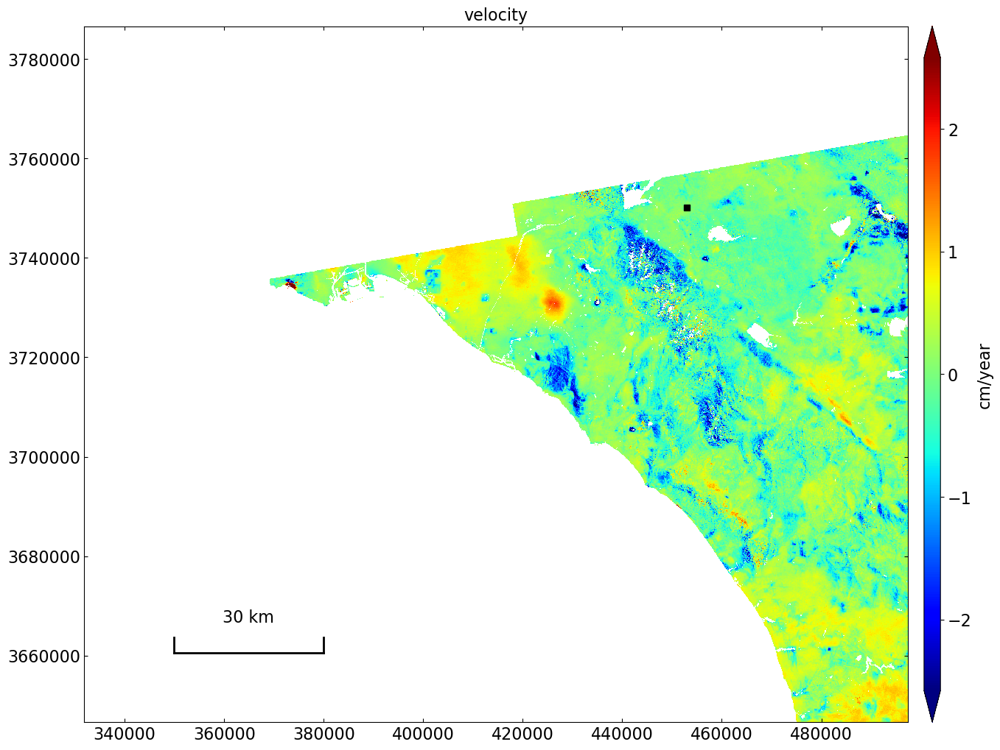

In [32]:
%matplotlib inline
cmap = 'jet' if 'red for uplift' in colormap_select.value else 'jet_r'

vel_vmin, vel_vmax = util.get_mintpy_vmin_vmax(mint_path/'velocity.h5', mask_path=mint_path/'maskTempCoh.h5', bottom_percentile=0.05)

# uncomment the following 2 lines to manually set the vmin and vmax values
# vel_vmin = -2.0
# vel_vmax = 2.0

scp_args = f'{mint_path}/velocity.h5 velocity -v {vel_vmin} {vel_vmax} --dpi 600 --figsize 15 15 --outfile {plot_path}/velocity.png --update --colormap {cmap}'
view.main(scp_args.split())

<div class="alert alert-info">
<b>Note :</b> 
Negative values indicates that target is moving away from the radar (i.e., Subsidence in case of vertical deformation).
Positive values indicates that target is moving towards the radar (i.e., uplift in case of vertical deformation). 
</div>

---
## 13. Geocode velocity.h5 in Preparation for Creating a velocity.kmz

**Run the `geocode` step**

- This is unnecessary for geocoded HyP3 data but would be needed for non-geocoded data

In [36]:
!smallbaselineApp.py $config_path --work-dir {mint_path} --dostep geocode

MintPy version 1.5.3, date 2023-11-23
--RUN-at-2024-04-19 19:41:45.003773--
Current directory: /home/jovyan/test_MintPy_OpenSARLab/LA2
Run routine processing with smallbaselineApp.py on steps: ['geocode']
Remaining steps: ['google_earth', 'hdfeos5']
--------------------------------------------------
Go to work directory: /home/jovyan/la2_test/MintPy
read default template file: /home/jovyan/la2_test/MintPy/smallbaselineApp.cfg


******************** step - geocode ********************
dataset is geocoded, skip geocoding and continue.
Go back to directory: /home/jovyan/test_MintPy_OpenSARLab/LA2

################################################
   Normal end of smallbaselineApp processing!
################################################
Time used: 00 mins 0.0 secs



---
## 14. Create a kmz File

**Run the `google_earth` step**

In [38]:
!smallbaselineApp.py $config_path --work-dir {mint_path} --dostep google_earth

MintPy version 1.5.3, date 2023-11-23
--RUN-at-2024-04-19 19:45:43.645142--
Current directory: /home/jovyan/test_MintPy_OpenSARLab/LA2
Run routine processing with smallbaselineApp.py on steps: ['google_earth']
Remaining steps: ['hdfeos5']
--------------------------------------------------
Go to work directory: /home/jovyan/la2_test/MintPy
read default template file: /home/jovyan/la2_test/MintPy/smallbaselineApp.cfg


******************** step - google_earth ********************
creating Google Earth KMZ file for geocoded velocity file: ...

save_kmz.py /home/jovyan/la2_test/MintPy/velocity.h5 -o /home/jovyan/la2_test/MintPy/velocity.kmz
data   coverage in y/x: (0, 0, 2069, 1750)
subset coverage in y/x: (0, 0, 2069, 1750)
update LENGTH, WIDTH, Y/XMAX
update/add SUBSET_XMIN/YMIN/XMAX/YMAX: 0/0/2069/1750
update Y/X_FIRST
update REF_Y/X
read mask from file: maskTempCoh.h5
masking out pixels with zero value in file: None
colormap: jet
plotting data ...
figure size : [14.2, 12.0]
show refere

In [5]:
!save_kmz.py /home/jovyan/la2_test/MintPy/velocity.h5 -o /home/jovyan/la2_test/MintPy/velocity.kmz

data   coverage in y/x: (0, 0, 2069, 1750)
subset coverage in y/x: (0, 0, 2069, 1750)
update LENGTH, WIDTH, Y/XMAX
update/add SUBSET_XMIN/YMIN/XMAX/YMAX: 0/0/2069/1750
update Y/X_FIRST
update REF_Y/X
read mask from file: maskTempCoh.h5
masking out pixels with zero value in file: None
colormap: jet
plotting data ...
figure size : [14.2, 12.0]
show reference point
writing /home/jovyan/la2_test/MintPy/velocity_data.png with dpi=600
writing /home/jovyan/la2_test/MintPy/velocity_cbar.png
writing /home/jovyan/la2_test/MintPy/velocity.kml
remove /home/jovyan/la2_test/MintPy/velocity.kml
remove /home/jovyan/la2_test/MintPy/velocity_data.png
remove /home/jovyan/la2_test/MintPy/velocity_cbar.png
merged all files to /home/jovyan/la2_test/MintPy/velocity.kmz


In [39]:
vel_kmz_path = mint_path / 'velocity.kmz'

if not vel_path.exists():
    raise Exception(f'Possible error running smallbaselineApp google_earth step. Expected output not found: {vel_kmz_path}')

In [4]:
!save_kmz_timeseries.py /home/jovyan/la2_test/MintPy/timeseries_ERA5_demErr.h5

open timeseries file: timeseries_ERA5_demErr.h5
UTM coordinates detected, convert UTM into lat/lon
input data shape in row/col: 1750/2069
writing /home/jovyan/la2_test/MintPy/google_earth_cbar.png
add reference point.
------------------------------
step: 20 pixels
number of output boxes: 6
UTM coordinates detected, convert UTM into lat/lon
create KML doc for box 1/6: (0, 0, 1000, 1000), step: 20 pixels, 2500 pixels in total ...
UTM coordinates detected, convert UTM into lat/lon
create KML doc for box 2/6: (1000, 0, 2000, 1000), step: 20 pixels, 2500 pixels in total ...
UTM coordinates detected, convert UTM into lat/lon
create KML doc for box 3/6: (2000, 0, 2069, 1000), step: 20 pixels, 150 pixels in total ...
UTM coordinates detected, convert UTM into lat/lon
create KML doc for box 4/6: (0, 1000, 1000, 1750), step: 20 pixels, 1850 pixels in total ...
UTM coordinates detected, convert UTM into lat/lon
create KML doc for box 5/6: (1000, 1000, 2000, 1750), step: 20 pixels, 1850 pixels in 

---
## 15. Plot the unwrapped inverted timeseries again after tropospheric (optional) and topospheric correction

In [ ]:
geotiff_path = mint_path / 'GeoTiffs'
disp_path = geotiff_path / 'displacement_maps'
unwrapped_path = disp_path / 'unwrapped'
unwrapped_path.mkdir(parents=True, exist_ok=True)
ts_demErr_path = list(mint_path.glob('timeseries*_demErr.h5'))

**If you have both tropospheric delay corrected and uncorrected time series available, select which to plot**

- If you have run the time series more than once, with tropospheric correction both on and off, you will have time series saved for both configurations
- `timeseries_demErr.h5` is the time series not corrected for tropospheric delay
- `timeseries_ERA5_demErr.h5` is the time series corrected for tropospheric delay

In [ ]:
if len(ts_demErr_path) > 1:
    ts_select_option = osl.select_parameter(
        [
            ts_demErr_path[0],
            ts_demErr_path[1]
        ],
        description='Select the time series file you wish to plot:'
    )
    display(ts_select_option)
else:
    ts_demErr_sel_path = ts_demErr_path[0]

In [ ]:
if len(ts_demErr_path) > 1:
    ts_demErr_sel_path = ts_select_option.value

inv_vmin, inv_vmax = util.get_mintpy_vmin_vmax(ts_demErr_sel_path, mask_path=mint_path/'maskTempCoh.h5',  bottom_percentile=0.0)

# uncomment the following 2 lines to manually set the vmin and vmax values
# inv_vmin = -2.0
# inv_vmax = 2.0

scp_args = f'{ts_demErr_sel_path} --notitle --notick --noaxis -v {inv_vmin} {inv_vmax} --dpi 600 --figsize 15 15 --outfile {unwrapped_path}/unwrapped_inverted_ts.png'
view.main(scp_args.split())

---
## 16. Plot a Motion Transect

**Select two points to define a transect on an interactive plot**

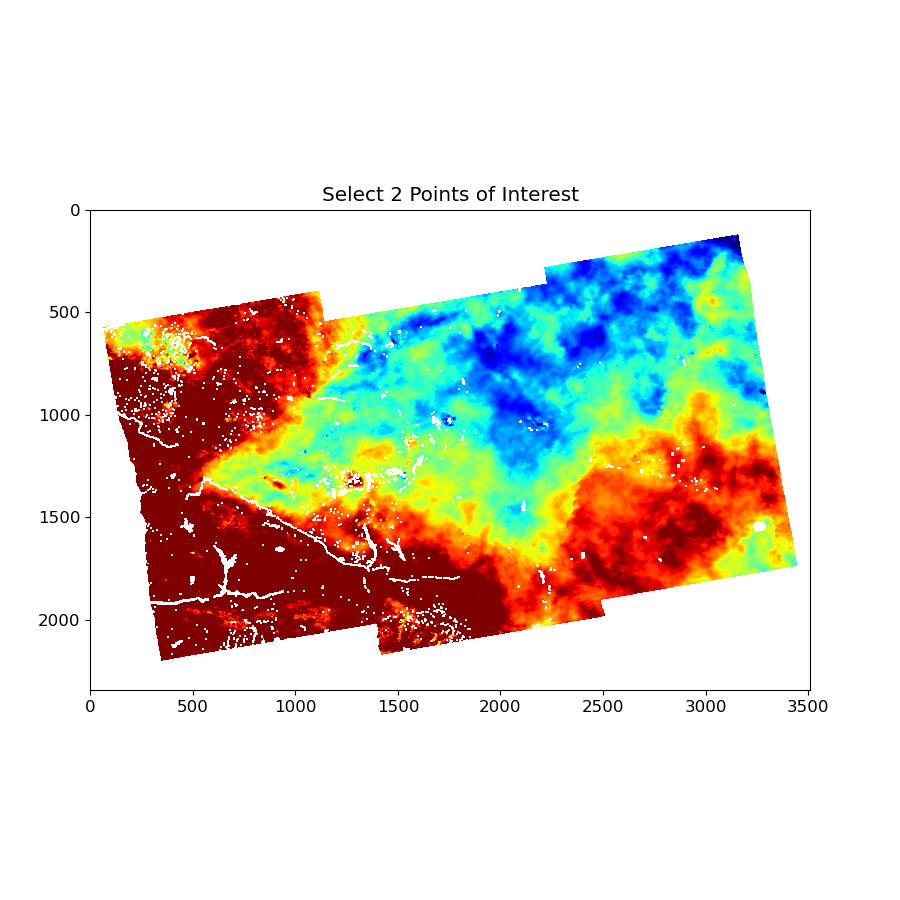

In [33]:
%matplotlib widget

vel_vmin, vel_vmax = util.get_mintpy_vmin_vmax(velocity_path, mask_path=mint_path/'maskTempCoh.h5',  bottom_percentile=0.05)

# uncomment the following 2 lines to manually set the vmin and vmax values
# vel_vmin = -2.0
# vel_vmax = 2.0

data, vel_info = mintpy.utils.readfile.read(velocity_path)
mask = np.ma.masked_where(data==0, data)
data = mask.filled(fill_value=np.nan)
line = osl.LineSelector(data, figsize=(9, 9), cmap='jet', vmin=vel_vmin/100, vmax=vel_vmax/100)

**Plot the selected motion transect**

point 1: [460680.2083333333, 3904764.626736111]
point 2: [427539.65277777775, 3898136.515625]
plot_transection.py /home/jovyan/la_test/MintPy/velocity.h5 -v -4.913689420558512 4.913689420558512 --no-tight-layout --start-lalo 3904764.626736111 460680.2083333333 --end-lalo 3898136.515625 427539.65277777775 --noverbose --nodisplay
view.py /home/jovyan/la_test/MintPy/velocity.h5 velocity -v -4.913689420558512 4.913689420558512 --no-tight-layout --noverbose --nodisplay
figure size : [10.0, 5.3]
plot_transection.py /home/jovyan/la_test/MintPy/velocity.h5 -v -4.913689420558512 4.913689420558512 --no-tight-layout --start-lalo 3904764.626736111 460680.2083333333 --end-lalo 3898136.515625 427539.65277777775 --outfile x
run view.py in MintPy version 1.5.3, date 2023-11-23
input file is velocity file: /home/jovyan/la_test/MintPy/velocity.h5 in float32 format
file size in y/x: (2344, 3509)
input dataset: "['velocity']"
turning glob search OFF for velocity file
num of datasets in file velocity.h5: 5

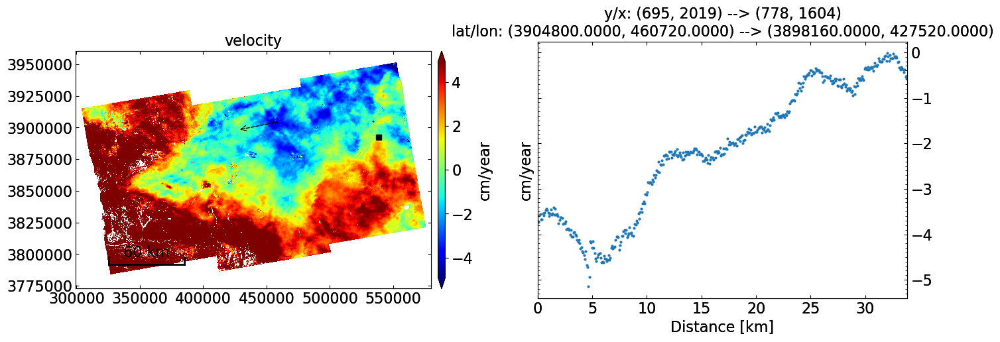

In [34]:
geotrans = (float(vel_info['X_FIRST'])), float(vel_info['X_STEP']) , 0.0, float(vel_info['Y_FIRST']), 0.0, float(vel_info['Y_STEP'])

def geolocation(x, y, geotrans):
    return [geotrans[0]+x*geotrans[1], geotrans[3]+y*geotrans[5]]

try:
    pnt_1 = geolocation(line.pnt1[0][0], line.pnt1[0][1], geotrans)
    pnt_2 = geolocation(line.pnt2[0][0], line.pnt2[0][1], geotrans)
    print(f"point 1: {pnt_1}")
    print(f"point 2: {pnt_2}")
except TypeError:
    print('TypeError')
    display(Markdown(f'<text style=color:red>This error may occur if a line was not selected.</text>'))

transection_args = f'{mint_path}/velocity.h5 -v {vel_vmin} {vel_vmax} --no-tight-layout --start-lalo {pnt_1[1]} {pnt_1[0]} --end-lalo {pnt_2[1]} {pnt_2[0]} --outfile x'

with osl.work_dir(plot_path):
    # let MintPy cleanup its old subplots 
    # this has been fixed in MintPy 1.5.3 but is required for 1.5.1
    plot_transection.main(transection_args.split()[:-2] + ['--noverbose', '--nodisplay'])
    # plot transection after removing old subplots
    %matplotlib inline
    plot_transection.main(transection_args.split())

---
## 17. Plot the Cumulative Displacement Map and Point Displacement Time Series

- Use the `Time` bar below the Cumulative Displacement Map to view displacements for different time periods
- Click on the Cumulative Displacement Map to select points for displaying Point Displacement Time-Series

In [ ]:
%matplotlib widget

tsview.main(
    [
        str(ts_demErr_sel_path),
        f'-d={mint_path}/inputs/geometryGeo.h5', 
        f'-o={mint_path}/displacement_ts',
        f'--outfile={mint_path}/displacement_ts.pdf'
    ]
)